# Arguments of ImageDataGenerator

In [1]:
%matplotlib inline

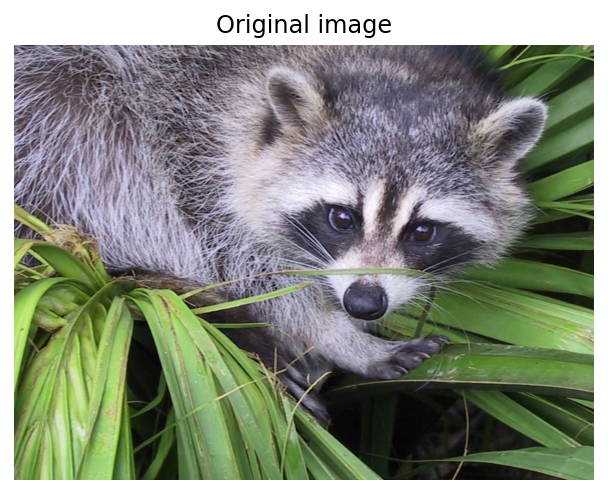

In [2]:
import matplotlib.pyplot as plt
import scipy.misc
original_image = scipy.misc.face()
plt.imshow(original_image)
plt.axis('off')
plt.title('Original image')
plt.show()

## Parameters

In [3]:
parameters = dict(
    featurewise_center=True,
    samplewise_center=True,
    featurewise_std_normalization=True,
    samplewise_std_normalization=True,
    #     zca_whitening=True,
    #      zca_epsilon=1e-6,
    rotation_range=180,
    width_shift_range=.2,
    height_shift_range=.2,
    brightness_range=[.8, 1],
    shear_range=45,
    zoom_range=[.5, 1.5],
    channel_shift_range=.5,
    #      fill_mode='nearest',
    #      cval=0.,
    horizontal_flip=True,
    vertical_flip=True,
    #      rescale=None,
    #      preprocessing_function=None,
    #      data_format='channels_last',
    #      validation_split=0.0,
    #      interpolation_order=1,
)

featurewise_center


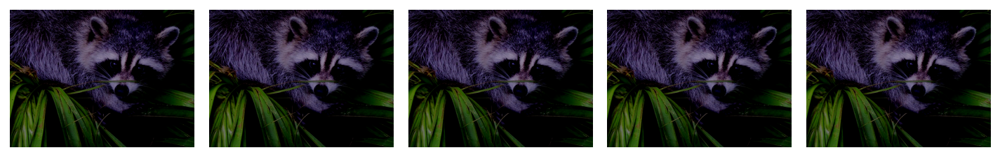

samplewise_center


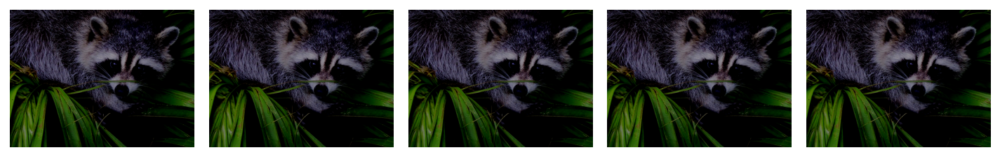

featurewise_std_normalization


c:\users\suzuki\anaconda3\envs\ai_tut\lib\site-packages\keras_preprocessing\image\image_data_generator.py:348: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn('This ImageDataGenerator specifies '


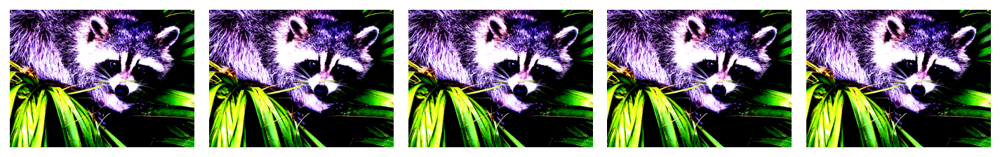

samplewise_std_normalization


c:\users\suzuki\anaconda3\envs\ai_tut\lib\site-packages\keras_preprocessing\image\image_data_generator.py:355: UserWarning: This ImageDataGenerator specifies `samplewise_std_normalization`, which overrides setting of `samplewise_center`.
  warnings.warn('This ImageDataGenerator specifies '


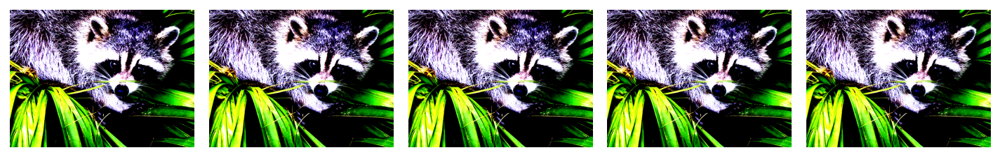

rotation_range


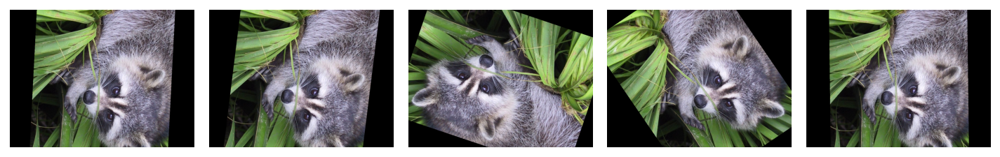

width_shift_range


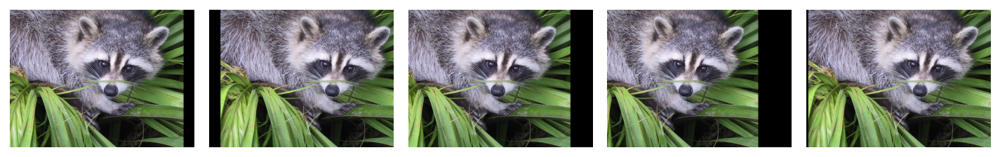

height_shift_range


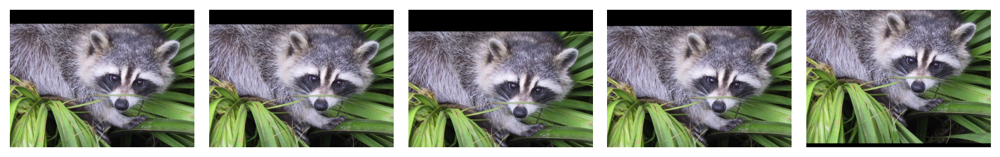

brightness_range


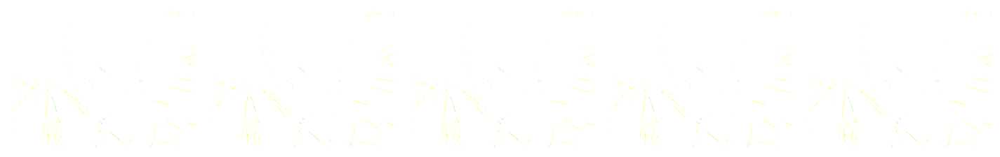

shear_range


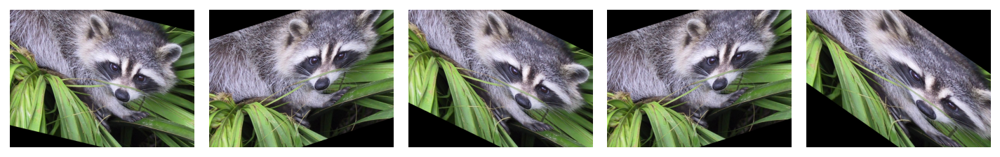

zoom_range


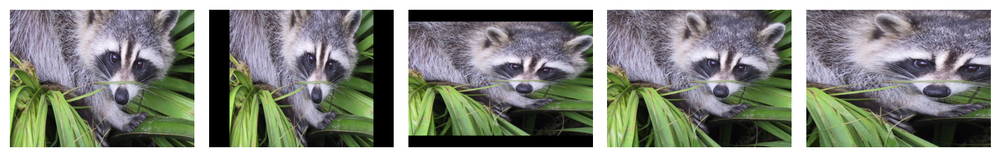

channel_shift_range


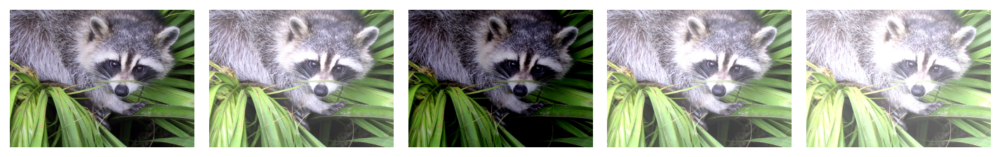

horizontal_flip


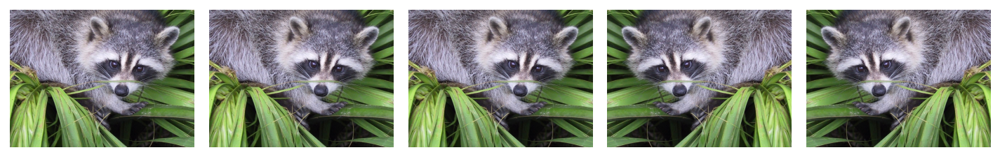

vertical_flip


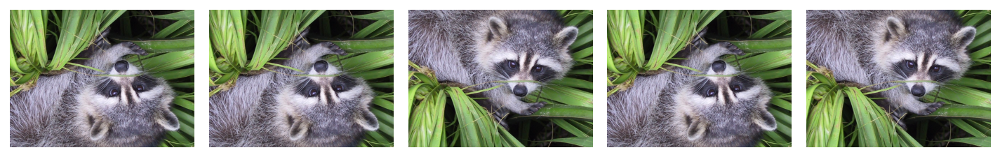

In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
data = np.expand_dims(original_image, 0) / 255
n_samples = 5
for param_name, param_value in parameters.items():
    print(param_name)
    plt.figure(figsize=(10, 5))
    datagen = ImageDataGenerator(**{
        param_name: param_value,
        'fill_mode': 'constant'
    })
    datagen.fit(data)
    flow = datagen.flow(data, batch_size=1)
    for i in range(n_samples):
        plt.subplot(1, n_samples, i + 1)
        augmented = flow[0][0]
        plt.imshow(np.clip(augmented, 0, 1))
        plt.axis('off')
    plt.tight_layout()
    plt.show()

## Fill mode

constant


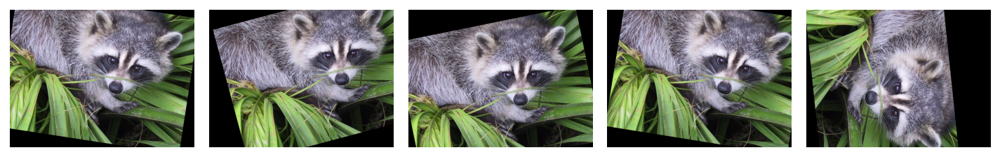

nearest


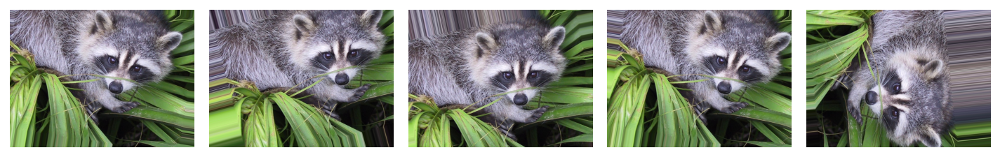

reflect


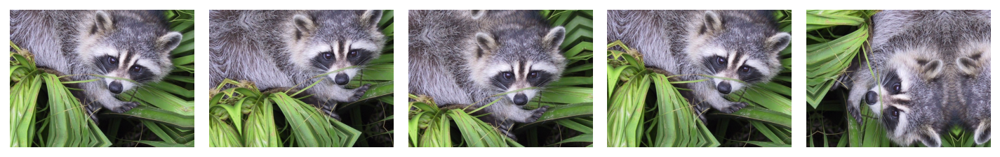

wrap


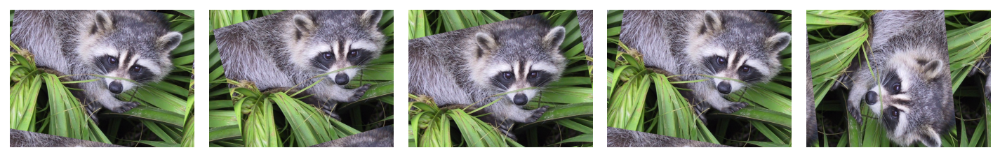

In [5]:
fill_modes = ['constant', 'nearest', 'reflect', 'wrap']
n_samples = 5
seed = 0
for fill_mode in fill_modes:
    print(fill_mode)
    plt.figure(figsize=(10, 5))
    datagen = ImageDataGenerator(fill_mode=fill_mode,
                                 rotation_range=90,
                                 width_shift_range=.1,
                                 height_shift_range=.1)
    flow = datagen.flow(data, batch_size=1, seed=seed)
    for i in range(n_samples):
        plt.subplot(1, n_samples, i + 1)
        augmented = flow[0][0]
        plt.imshow(np.clip(augmented, 0, 1))
        plt.axis('off')
    plt.tight_layout()
    plt.show()

## ZCA whitening
[Whitening transformation - Wikipedia](https://en.wikipedia.org/wiki/Whitening_transformation)

In [6]:
from tensorflow.keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

In [7]:
datagen = ImageDataGenerator(zca_whitening=True)
datagen.fit(x_train)

c:\users\suzuki\anaconda3\envs\ai_tut\lib\site-packages\keras_preprocessing\image\image_data_generator.py:336: UserWarning: This ImageDataGenerator specifies `zca_whitening`, which overrides setting of `featurewise_center`.
  warnings.warn('This ImageDataGenerator specifies '


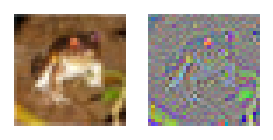

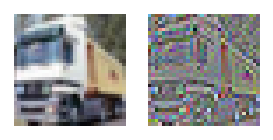

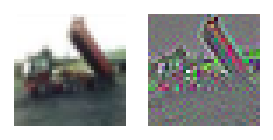

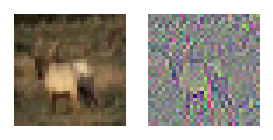

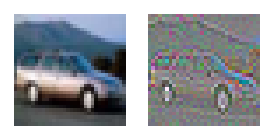

In [8]:
def normalize(arr):
    return (arr - arr.min()) / (arr.max() - arr.min())


n_samples = 5
flow = datagen.flow(x_train, shuffle=False, batch_size=1)
for i in range(n_samples):
    original = x_train[i]
    augmented = normalize(flow[i][0])

    plt.figure(figsize=(2, 2))
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(augmented)
    plt.axis('off')
    plt.tight_layout()
    plt.show()